# Рынок заведений общественного питания Москвы

Исследование рынка общественного питания на основе открытых данных, подготовка презентации для инвесторов

In [1]:
#Импорт библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go

import json
from folium import Map, Choropleth
from folium import Marker, Map
from folium.features import CustomIcon
from folium.plugins import MarkerCluster

In [2]:
#Выгружаем данные
data = pd.read_csv('/datasets/moscow_places.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


# Шаг 2. Выполните предобработку данных

### Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

In [3]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [4]:
#проверка на наличие явных дубликатов
data.duplicated().sum()

0

In [5]:
#ознакомимся с уникальнями значениями
data['name'].unique()

array(['WoWфли', 'Четыре комнаты', 'Хазри', ..., 'Миславнес', 'Самовар',
       'Kebab Time'], dtype=object)

In [6]:
#заменим е на ё
data['name'].replace('е','ё')
data['name'].head(15)

0                   WoWфли
1           Четыре комнаты
2                    Хазри
3     Dormouse Coffee Shop
4                Иль Марко
5             Sergio Pizza
6              Огни города
7               Mr. Уголёк
8              Donna Maria
9                   Готика
10          Great Room Bar
11             Шашлык Шефф
12                Заправка
13                 Буханка
14                У Сильвы
Name: name, dtype: object

In [7]:
#теперь проверим на неявные, понизив регистр 
data['name'].str.lower()

0                     wowфли
1             четыре комнаты
2                      хазри
3       dormouse coffee shop
4                  иль марко
                ...         
8401              суши мания
8402               миславнес
8403                 самовар
8404            чайхана sabr
8405              kebab time
Name: name, Length: 8406, dtype: object

In [8]:
#проверка на пропуски
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Можно заметить, что в 8 столбцах пропусков нет, больше всего пропусков в столбцах с ценой, а также с количеством посадочных мест. В принципе, эти пропуски не помешают дальнейшему исследованию, а заполнять их средним или медианным значением я не вижу смысла. 

Поработаем с пропусками

In [9]:
#посчитаем количество пропусков в столбце со временем работы заведений
print( "Пропуски во времени работы заведений в процентном соотношении:", round(data['hours'].isna().mean() * 100, 2))

Пропуски во времени работы заведений в процентном соотношении: 6.38


Процент достаточно мал, поэтому не будем его никак заменять, однако, для дальнейшего удобства заполним их некоторым значением. 

In [10]:
data['hours'] = data['hours'].fillna('Unknown')

Посмотрим что со столбцом "price"

In [11]:
print("Пропуски:", round(data['price'].isna().mean() * 100, 2))

Пропуски: 60.56


Так же, как и с предыдущим столбцом, заменим на неизвестное значение, поскольку заменить на что-то подходящее будет достаточно проблематично. 

In [12]:
data['price'] = data['price'].fillna('Unknown')

Перейдем на столбец "avg_bill", где тоже достаточно приличное количество пропусков.

In [13]:
print(data['avg_bill'].value_counts(),'\n' * 2,
      "Пропуски:", round(data['avg_bill'].isna().mean() * 100, 2))

Средний счёт:1000–1500 ₽      241
Средний счёт:1500–2000 ₽      120
Средний счёт:300–500 ₽         90
Средний счёт:500–1000 ₽        78
Средний счёт:1500–2500 ₽       68
                             ... 
Средний счёт:275 ₽              1
Средний счёт:372 ₽              1
Цена бокала пива:320–460 ₽      1
Средний счёт:170–280 ₽          1
Средний счёт:230–350 ₽          1
Name: avg_bill, Length: 897, dtype: int64 

 Пропуски: 54.6


Как и в прошлых столбцах, заменить пропуски не представляется возможным, также оставим в пропусках неизвестное значение. 

In [14]:
data['avg_bill'] = data['avg_bill'].fillna('Unknown')

Теперь пропуски в средних чеках и ценах, пропущенные значения заменим большим числом:

In [15]:
data['middle_avg_bill'] = data['middle_avg_bill'].fillna(999999)
data['middle_coffee_cup'] = data['middle_coffee_cup'].fillna(999999)

Я выбрала похожю работу с пропусками, потому что, опять же, заполнить их по какому-то логичному принципу не представляется возможным, поэтому воспользуемся тем же решением, что и раньше для оставшихся столбцов. 

In [16]:
data['seats'] = data['seats'].fillna(999999)

# изменим тип данных
data['seats'] = data['seats'].astype('int')

### Создайте столбец street с названиями улиц из столбца с адресом.


In [17]:
data['street'] = data['address'].str.split(', ').apply(lambda x: x[1])

### Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение True — если заведение работает ежедневно и круглосуточно;
- логическое значение False — в противоположном случае.

In [19]:
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

Таким образом, на местах пропусков теперь стоят неизвестные значения, так как логичная замена не представляется возможной, а удалить их нельзя, так как потеряем большую часть данных. 

Также было добавлено два новых столбца с улицами из адресов заведений и обозначением о временном типе работы заведения. И изменен тип данных в столбце с количеством посадочных мест, ведь это значение должно быть целочисленным. 


# Шаг 3. Анализ данных

## Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [20]:
# построим сводную таблицу
categories = data.pivot_table(index='category',values='address',aggfunc='count').reset_index()
categories

,category,address
0,"бар,паб",765
1,булочная,256
2,быстрое питание,603
3,кафе,2378
4,кофейня,1413
5,пиццерия,633
6,ресторан,2043
7,столовая,315


In [21]:
categories = data.pivot_table(index='category',values='address',aggfunc='count').reset_index()
fig = go.Figure(data = [go.Pie(labels=categories['category'], values=categories['address'])]) 
fig.update_layout(#legend_orientation="h",
                  legend=dict(x=1.0, xanchor="right"),
                  title="Распределение заведений питания по категориям",
                  #xaxis_title="x Axis Title",
                  #yaxis_title="y Axis Title",
                  margin=dict(l=0, r=0, t=80, b=0))
fig.show()

Наглядно можно увидеть большое количество кафе и ресторанов, меньше всего булочных и столовых.

## Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

Исследуем количество посадочных мест в среднем приходящиеся на каждое заведение и просмотрим заведения с заказами на вынос

In [22]:
# заведения с посадочными местами
table_seats = data[data['seats'] != 999999].groupby('category')['seats'].mean().sort_values(ascending=False).reset_index()
table_seats.columns = ['category', 'seats_mean']



In [23]:
# визуализируем заведения, где есть пос. места.
fig = px.bar(table_seats, x='category', y='seats_mean',
            labels={'category':'Вид заведения', 'seats_mean':'Кол-во посадочных мест'},
            title='Среднее кол-во посадочных мест')
fig.show()


Делаем вывод, что в среднем по кол-ву посадочных мест первые места занимают бары,пабы и рестораны, а также кофейни. Самое маленькое количество посадочных мест булочных и пиццерий, что в принципе логично, ведь послдение являются заведениями, в которых не принято находиться долгое время, следовательно и большое количество мест не нужно, заведения работают на поток посетителей, в отличие от тех же ресторанов  

## Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

Посмотрим на соотношение сетевых и несетевых мест и узнаем какому типу заведения привычнее являться сетевым или несетевым


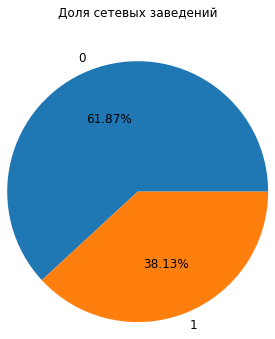

In [24]:
#построим круговую диаграмму 
data['chain'].value_counts().plot.pie(radius=1.5,   
                                    autopct='%1.2f%%', 
                                    fontsize=12)

plt.title('Доля сетевых заведений' + '\n'*4)
plt.ylabel(None)
plt.show()

Большую долю, а именно 62% заведений составляют несетевые заведения

## Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

Исследуем колличественное соотношение между сетевыми и несетевыми заведениями:

In [25]:
chain_inst = data[data['chain'] == 1].groupby('category')['chain'].count().sort_values(ascending=False).reset_index()
chain_inst.columns = ['category','chain_cnt']

In [26]:
fig = px.bar(chain_inst, x='category', y='chain_cnt',
            labels={'category':'Тип заведения', 'chain_cnt':'Кол-во сетевых заведений'},
            title='Сравнение заведений между категориями')
fig.show()

Сравнивая категории по количеству сетевых и несетевых заведения, видно, что кафе, кофейни и рестораны чаще остальных заведений являются сетевыми, в отличие от столовых, которые в этом рейтинге на последнем месте. 

In [27]:
# сгруппируем основную таблицу
chain_data = data.groupby('category').agg({'chain' : 'count'}).rename(columns={'chain': 'total_chain'}).reset_index()

# посчитаем количество сетевых и несетевых 
temp = data[data.chain == 0].groupby('category').agg({'chain' : 'count'}).reset_index()
temp1 = data[data.chain == 1].groupby('category').agg({'chain' : 'count'}).reset_index()

In [28]:
# добавим столбцы, рассчитав долю сетевых и несетевых заведений
chain_data['not_chain, %'] = round(temp['chain']/chain_data['total_chain']*100,2)
chain_data['chain, %'] = round(temp1['chain']/chain_data['total_chain']*100,2)

# удалим лишнее и сортируем
chain_data = chain_data.drop(columns=['total_chain']).sort_values(by='not_chain, %', ascending=False)

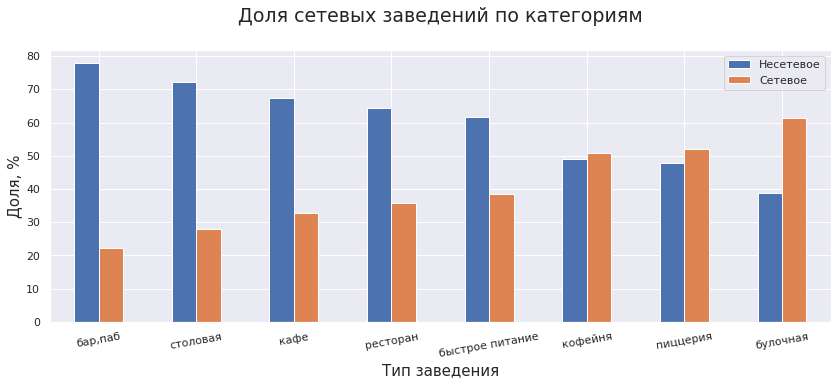

In [29]:
#строим график
sns.set()
chain_data.plot.bar(x='category', figsize=(14,5), rot=10)
plt.xlabel('Тип заведения', size=15)
plt.ylabel('Доля, %', size=15)
plt.title('Доля сетевых заведений по категориям' + '\n', size=19)
plt.legend(["Несетевое", "Сетевое"], loc='upper right')

plt.show()

## Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся? Отобразите общее количество заведений и количество заведений каждой категории по районам.

Исходим из количества сетевых заведений по Москве. 

In [30]:
top_15_chains = data[data['chain'] == 1]['name'].value_counts()[:15].sort_values(ascending=False).to_frame().reset_index()
top_15_chains.columns = ['name', 'chain_cnt']

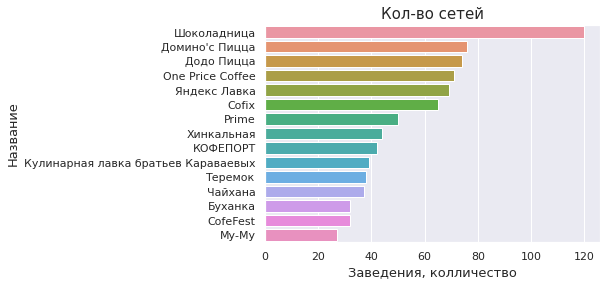

In [31]:
sns.set()
sns.barplot(data=top_15_chains, x='chain_cnt', y='name')
plt.title('Кол-во сетей', size=15)
plt.xlabel('Заведения, колличество', size=13)
plt.ylabel('Название', size=13)
plt.show()

Видно, что в тройке лидеров - Шоколадница, Домино'с Пицца и Додо Пицца, достаточно популярные сети в целом по России. 

Также посмотрим типы заведений этих топ-15:

In [32]:
# список 15 популярных сетевых заведений, фильр по списку
list_top_chains = list(top_15_chains['name'])
data_filter_chains = data[data.name.isin(list_top_chains)]

In [33]:
top = data_filter_chains['category'].value_counts().to_frame().reset_index()
top.columns = ['category', 'cnt']

In [34]:
fig = px.pie(top, values='cnt', names='category', title='Доли по категориям топа сетевых заведений')
fig.show()

И в результате можно увидеть, что весомая данных сетей из топа - это кофейни, рестораны и пиццерии

## Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [35]:
# группируем количество типов заведений по округам
a = data_filter_chains.groupby(['district', 'category']).agg({'name':'count'}).reset_index()
a.columns = ['district', 'category', 'cnt']

# считаем общее кол-во заведений по каждому округу 
b = a.groupby('district')['cnt'].transform('sum').to_frame()
b.columns = ['total_cnt']

# объединяем 2 сгруппированных таблицы
c = a.join(b).sort_values(by='total_cnt', ascending=False)

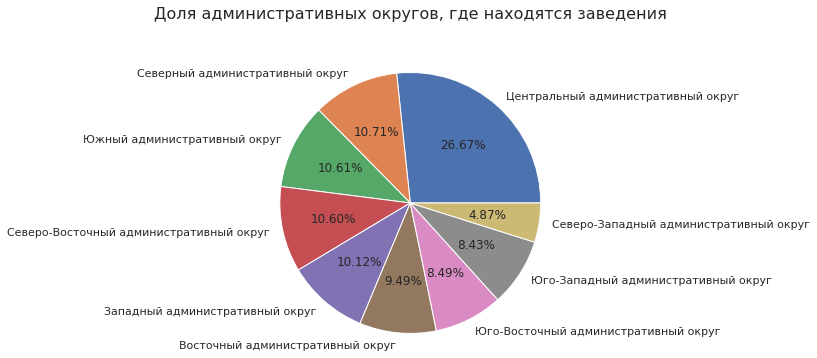

In [36]:
data['district'].value_counts().plot.pie(radius=1.5,   
                                    autopct='%1.2f%%')

plt.title('Доля административных округов, где находятся заведения' + '\n'*4, size=16)
plt.ylabel(None)
plt.show()

Отобразим общее количество заведений и количество заведений каждой категории по районам:

In [37]:
# группировка кол-ва типов заведений по округам
d = data.groupby(['district', 'category']).agg({'name':'count'}).reset_index()
d.columns = ['district', 'category', 'cnt']

# общее колво заведений по каждому округу 
e = a.groupby('district')['cnt'].transform('sum').to_frame()
e.columns = ['total_cnt']

# объединение таблиц 
f = d.join(e).sort_values(by='cnt', ascending=False)
fh = d.groupby('district')['cnt'].sum().to_frame().reset_index().sort_values(by='cnt', ascending=False)   
fh

,district,cnt
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


In [38]:
#построим интерактивный график
fig = px.bar(f, # загружаем данные
            x='district', # указываем столбец с данными для оси X
            y='cnt', # указываем столбец с данными для оси Y
            color='category', # обозначаем категорию для разделения цветом
            title='Распределение по районам всех заведений', # указываем заголовок
            barmode='stack', height = 700) # выбираем «полупрозрачный» тип отображения столбцов

fig.add_trace(go.Scatter(
    x=fh.district, 
    y=fh['cnt'],
    text=fh['cnt'],
    mode='text',
    textposition='top center',
    textfont=dict(
        size=18,
    ),
    showlegend=False
))

fig.update_xaxes(title_text='Название округа') # подпись для оси X
fig.update_yaxes(title_text='Кол-во заведений') # подпись для оси Y
fig.show() # выводим график

Очевидно, что центральный округ будет самым насыщенным на заведения, а больше всего на рестораны. 

Как видно из графика, в других районах ресторанов гораздо меньше, на их место "встают" кафе и так далее. 

В целом все округа, кроме центрального и северно-западного примерно одинаково заполненны заведениями, в северо-западном заведений меньше всего. 

## Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [39]:
rate = data.groupby('category').agg({'rating': 'mean'}).round(2).sort_values(by='rating').reset_index()
rate

,category,rating
0,быстрое питание,4.05
1,кафе,4.12
2,столовая,4.21
3,булочная,4.27
4,кофейня,4.28
5,ресторан,4.29
6,пиццерия,4.30
7,"бар,паб",4.39


In [40]:
fig = px.bar(rate, x='category', y='rating',
                 color="category",
                labels={'rating': 'Средний рейтинг', 'category': 'Категория заведения'},
                title='Распределение средних рейтингов по категориям заведений', text='rating')
fig.show()

Сразу можно сказать, что рейтинги несильно друг от друга отличаются, все находятся в районе 4-4,5, нет плохих рейтингов. Лидеры - бары, пабы, а так же пиццерии и рестораны. В данном графике на последнем месте сети быстрого питания. 

## Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. 

Нужно построимть фоновую картограмму, для начала сгруппируем данные районов со средним рейтингом заведений:

In [41]:
rating_data = data.groupby('district')['rating'].mean()
rating_data

district
Восточный административный округ           4.174185
Западный административный округ            4.181551
Северный административный округ            4.239778
Северо-Восточный административный округ    4.148260
Северо-Западный административный округ     4.208802
Центральный административный округ         4.377520
Юго-Восточный административный округ       4.101120
Юго-Западный административный округ        4.172920
Южный административный округ               4.184417
Name: rating, dtype: float64

In [42]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_map)

# выводим карту
m_map

Заметим, что самый высокий рейтинг заведений у центрального районе, самый низкий - в юго-восточном.

## Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [43]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_map)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m_map

Благодаря кластерам можно увидеть каждое заведение с рейтингом на карте

## Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [44]:
# определим топ-15 улиц с наиб. кол заведений
street_name = data.groupby(['street']).agg({'name':'count'}).sort_values(by='name', ascending=False)[:15].reset_index()
street_name.columns = ['street', 'name_cnt']

# разобъем их на категории и соединим
street_cat = data.groupby(['street', 'category']).agg({'category': 'count'}).rename(columns={'category':'cat_cnt'}).reset_index()

street_data = street_name.merge(street_cat, on='street', how='left').sort_values(by='name_cnt', ascending=False)
street_name

,street,name_cnt
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [45]:
fig = px.bar(street_data,
            x='street', y='cat_cnt', color='category', 
            barmode='stack',
            labels={'street':'Название улицы', 'cat_cnt':'Кол-во заведений'}, 
            title='Топ-15 улиц с наиб. кол-вом заведений по типам', height = 700)

fig.add_trace(go.Scatter(
    x=street_name.street, 
    y=street_name['name_cnt'],
    text=street_name['name_cnt'],
    mode='text',
    textposition='top center',
    textfont=dict(
    ),
    showlegend=False
))

fig.show()

Заметим, что в большинстве данного топа в основном кафе, рестораноы и кофейни. Самые насыщенные на заведениямя улицы - проспект Мира, Профсоюзная и проспект Вернандского.

## Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [46]:
#отфильтруем данные по улицам с одним заведением:
street_one = data['street'].value_counts().sort_values().to_frame().reset_index()
street_one = street_one[street_one['street'] == 1]
data_street_one = data[data.street.isin(list(street_one['index']))]

print("Всего улиц c одним заведением:", {len(data_street_one)})

Всего улиц c одним заведением: {458}


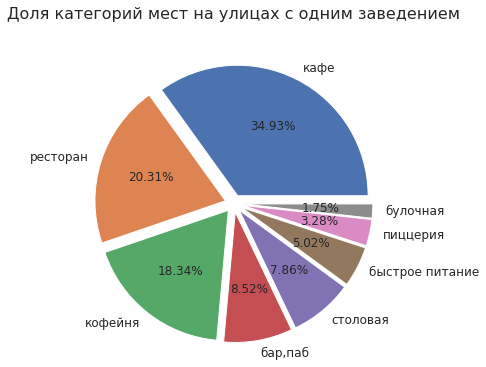

In [47]:
#посмотрим к каким типам заведения относятся данные общепиты
data_street_one['category'].value_counts().plot.pie(radius=1.5,   
                                    autopct='%1.2f%%', 
                                    fontsize=12,
                                    explode=(0.1, 0.1,0.1,0.1,0.1, 0.1, 0.1, 0.1))

plt.title('Доля категорий мест на улицах с одним заведением' + '\n'*4, size=16)
plt.ylabel(None)
plt.show()

Наблюдается та же общая тенденция по категориям заведений - на графике видно, что в основном этими заведяниями являются кафе, рестораны и кофейни.

посмотрим, в каких районах это происходит 

In [48]:
data_street_one['district'].value_counts(normalize=True)*100

Центральный административный округ         31.659389
Северо-Восточный административный округ    12.008734
Северный административный округ            11.353712
Восточный административный округ           11.353712
Южный административный округ                9.388646
Юго-Восточный административный округ        8.515284
Западный административный округ             7.641921
Северо-Западный административный округ      4.148472
Юго-Западный административный округ         3.930131
Name: district, dtype: float64

Как и предполагалось, такие улицы находятся в основном в центральном округе

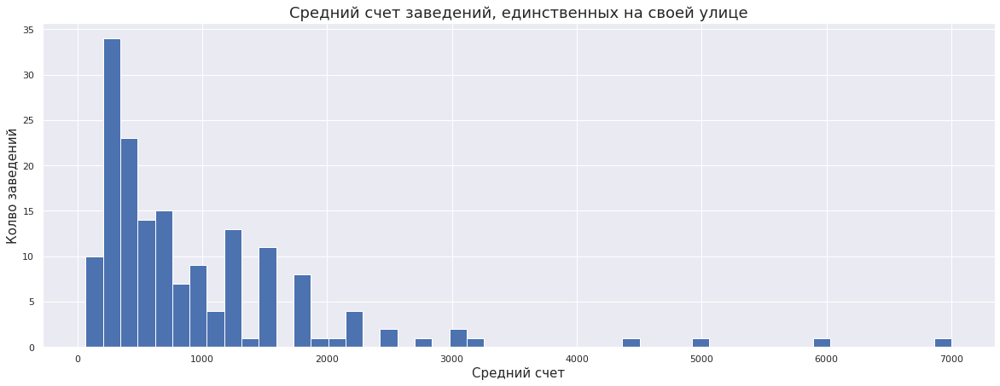

In [49]:
data_street_one[data_street_one['middle_avg_bill'] != 999999]['middle_avg_bill']\
        .plot.hist(figsize=(20,7), bins=50)
plt.title('Средний счет заведений, единственных на своей улице', size=18)
plt.xlabel('Средний счет', size=15)
plt.ylabel('Колво заведений', size=15)
plt.show()

Основная масса известных средних счетов находится в диапазоне 1-1,5 тыс. руб. Видно также и другие ценовые категории, дорогие, средний чек которых  5-7 тыс. руб. Однако таких заведений очень мало.

Построим хороплет со средними значениями среднего чека для каждого района

In [50]:
#сгруппруем нужную нам таблицу
bill = data[data['middle_avg_bill'] != 999999].groupby('district').agg({'middle_avg_bill' : 'mean'}).reset_index()
bill

,district,middle_avg_bill
0,Восточный административный округ,820.626923
1,Западный административный округ,1053.225490
2,Северный административный округ,927.959627
3,Северо-Восточный административный округ,716.611296
4,Северо-Западный административный округ,822.222930
5,Центральный административный округ,1191.057547
6,Юго-Восточный административный округ,654.097938
7,Юго-Западный административный округ,792.561702
8,Южный административный округ,834.398089


In [51]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_opacity=0.8,
    legend_name='Хороплет с полученными значениями для каждого района',
).add_to(m_map)

# выводим карту
m_map

Заметим, 2 округа в среднем превышают средний чек более, чем на 1 тыс. руб. Это центральный и западный. Центральный округ, ожидаемо, дороже остальных. Самое маленькое значение у юго-восточного и северо-восточного округа.

Сказать насчет изменения цен относительно удаленности однозначно будет проблематично, да, центральный округ очевидно самый "дорогой", однако прямой взаимосвязи между отдалением от центра и уменьшением цены, смотря на карту, я не вижу, дело может быть не столько в отдаленности, сколько в престиже сетевых заведений, которые и в отдаленных районах будут иметь похожие чеки, исходя из того, что в сеетвых заведениях предполагаются одинаковые цены. 

## Oбщий вывод.

- В Москве самые популярные категории заведений это - кафе, рестораны и кофейни. Булочные и столовые - напротив, в меньшинстве.


- Относительно количества посадочных мест - больше всего их в барах,пабах, а так же в ресторанах и кофейнях.


- Сетевых заведений - 38%. Большая доля - булочные, пиццерии и кофейни.


- Центральный район - самый популярный с точки зрения количества заведений, в частности по количеству ресторанов. 


- Насчет рейтингов заведений - самые высокие оценки у баров,пабов, а так же пиццерий и ресторанов. Оценки ниже у заведений быстрого питания и кафе.

- Самые высокие средние чеки наблюдаются в центральном и западном районах. Самые маленькие - в юго-восточном и северо-восточном районах.


# Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

Ответьте на следующие вопросы:

## Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [52]:
#фильтруем по кофейням
coffe_data = data[data['category'] == 'кофейня']
print(f"Общее количество кофеен в Москве: {len(coffe_data)}")

Общее количество кофеен в Москве: 1413


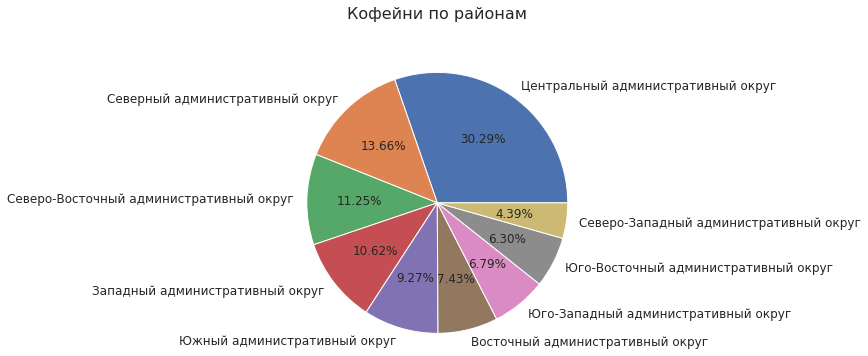

In [53]:
coffe_data['district'].value_counts().plot.pie(radius=1.5,   
                                    autopct='%1.2f%%', 
                                    fontsize=12)

plt.title('Кофейни по районам' + '\n'*4, size=16)
plt.ylabel(None)
plt.show()

Общее число кофеен - 1413. Территориально больше всего находятся в центральном районе, меньше - в северо-западном.

## Есть ли круглосуточные кофейни?

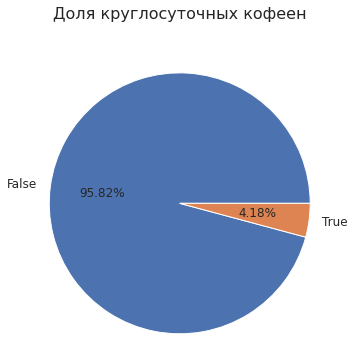

In [54]:
coffe_data['is_24/7'].value_counts().plot.pie(radius=1.5,   
                                    autopct='%1.2f%%', 
                                    fontsize=12)

plt.title('Доля круглосуточных кофеен' + '\n'*4, size=16)
plt.ylabel(None)
plt.show()

Всего 4% кофеен работают круглосуточно, почти что уникальный вариант, чтобы выделяться из общего фона. 

## Какие у кофеен рейтинги? Как они распределяются по районам?

In [55]:
rate_coffe = coffe_data.groupby('district').agg({'rating': 'mean'}).round(2).sort_values(by='rating').reset_index()

In [56]:
fig = px.bar(rate_coffe, x='district', y='rating',
                 color="district",
                labels={'rating': 'Средний рейтинг', 'district': 'Название округа'},
                title='Средний рейтинг кофеен по округам', text='rating')
fig.show()

Как можно заметить, средний рейтинг кофеен не ниже 4 во всех округах, однако самый высокий - в центральном, а ниже всех в западном округе.

## На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Посмотрим на среднюю цену за чашку кофе в округах

In [57]:
coffee_cup = coffe_data[coffe_data['middle_coffee_cup'] != 999999].groupby('district')\
                                    .agg({'middle_coffee_cup':'mean'}).reset_index()

In [58]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_map)

Choropleth(
    geo_data=state_geo,
    data=coffee_cup,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_opacity=0.6,
    legend_name='Средняя цена за чашку капучино',
).add_to(m_map)



m_map

Можно увидеть, что в центральном, западном и юго-западном районах цена за чашку кофе самая высокая. В юго-восточном же округе самая низкая. 

Исходя из этого, в зависимости от предполагаемого района расположения открывающейся кофейни, можно ориентироваться в цене за чашку кофе.

## Общие выводы, включая кофейни 

- В Москве самые популярные категории заведений это - кафе, рестораны и кофейни. Булочные и столовые - напротив, в меньшинстве.


- Относительно количества посадочных мест - больше всего их в барах,пабах, а так же в ресторанах и кофейнях.


- Сетевых заведений - 38%. Большая доля - булочные, пиццерии и кофейни.


- Центральный район - самый популярный с точки зрения количества заведений, в частности по количеству ресторанов. 


- Насчет рейтингов заведений - самые высокие оценки у баров,пабов, а так же пиццерий и ресторанов. Оценки ниже у заведений быстрого питания и кафе.

- Самые высокие средние чеки наблюдаются в центральном и западном районах. Самые маленькие - в юго-восточном и северо-восточном районах.



- Относительно кофеен, в среднем по всем округам у них хороший рейтинг (не меньше 4,2). Больше всего кофеен, очевидно, в Центральном и Северном районах. 

- Круглосуточных кофеен всего 4%

- Самая высокая средняя цена за чашку кофе в среднем в центральном, западном и юго-западном округах (190 руб). Самая низкая средняя цена  в юго-восточном округе (150 руб.)


Рекоментации по открытию заведения:
- Исходя из рейтинга заведений, лучшие из них находятся на Северо-Западе или в центре Москвы
- Однозначно стоит обратить внимание на Север отталкиваясь от рейтинга заведения и относительно низкой стоимости чека
- Круглосуточные заведения, а именно, кофейни - являются уникальными, стоит присмотреться к этому варианту
- Можно рассматривать районы рядом с аэропортами, там актуальна и круглосуточность и поток клиентов должен быть стабильным 

## Презентация

https://docs.google.com/presentation/d/1iq1j5kIIoexslYce04PjCIR5T8qS3AJvMoqSbU_8-k0/edit?usp=sharing


Сделала в гугл доках